In [1]:
!nvidia-smi

Sun Aug  8 15:20:04 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.57.02    Driver Version: 470.57.02    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  Off  | 00000000:01:00.0 Off |                  N/A |
| N/A   38C    P5    N/A /  N/A |    437MiB /  2002MiB |     20%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Let's import the necessary libraries

In [2]:
import os
import sys
import cv2
import shutil
import colorsys
import random
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from IPython.display import clear_output

Let's define some utility functions

In [3]:
def random_colors(N, bright=True):
    ''' Generate random colors  '''
    brightness = 1.0 if bright else 0.7
    hsv = [(i / N, 1, brightness) for i in range(N)]
    colors = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
    # random.shuffle(colors)
    return colors


def apply_mask(frame, mask, color, alpha=0.5):
    ''' Apply the given mask to the image '''
    image = frame.copy()
    for c in range(3):
        image[:, :, c] = np.where(mask == 1,
                                  image[:, :, c] *
                                  (1 - alpha) + alpha * color[c] * 255,
                                  image[:, :, c])
    return image

def create_dir(folder, force=True):
  '''   Create a directory if it doesn't exist  '''
  try:
    os.makedirs(folder)
    print('Directory {} created succesfully.'.format(folder))   
  except:
    if force:
      print('{} already exists. Creating a new one'.format(folder))
      shutil.rmtree(folder)
      os.makedirs(folder)
    else:
      print('{} already exists.'.format(folder))

Let's change directories and list all the files within the directory

Different backgrounds are used to perform Data Augmentation

In [3]:
dir_path = '/home/israel/Downloads/1280x720/'
background_paths = os.listdir(dir_path)
back = []
for background_path in background_paths:
    background = cv2.imread(os.path.join(dir_path, background_path))
    h, w, c = background.shape
    if h!=720 or w!=1280:
        background = cv2.resize(background, (1280, 720), cv2.INTER_AREA)
    back.append(background)

print(f'Number of background images {len(back)}')

Number of background images 46


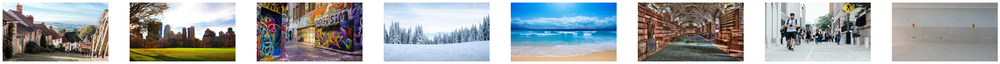

In [4]:
random.shuffle(back)
show = 8
plt.figure(figsize=(6*show,10))
for i, background in enumerate(back[:show]):
  plt.subplot(1, show, i+1); plt.imshow(background[:,:,::-1]); plt.axis('off');

In [5]:
def colorCast(img):
  ''' Takes a raw image as input and reduces the saturation of GREEN channel'''
  rng = np.array([0, 32, 64, 96, 128, 160, 192, 224, 255])
  norm_rng = rng / (2000 /(1 + 5))
  exprng = np.exp(norm_rng)
  exprng = 255 * ((exprng - exprng.max()) / (exprng.max() - exprng.min()) + 1)
  # Create a LookUp Table
  fullRange = np.arange(0, 256)
  gLUT = np.interp(fullRange, rng, exprng)

  # Get the green channel and apply the mapping
  gChannel = img[:, :, 1]
  gChannel = cv2.LUT(gChannel, gLUT)
  img[:, :, 1] = gChannel
  return img

def roi_gen(frame, mask_fine, mask_blur, bkgrn):
  ''' Takes an image plus its mask and returns the BGR and mask roi  '''
  height, width,_ = frame.shape
  x,y,w,h = cv2.boundingRect(mask_fine)
  offsets = [random.randint(0, w//4) for i in range(2)] + [random.randint(0, h//8) for i in range(2)] 
  x = x - offsets[0] if x - offsets[0] >=0 else 0
  y = y - offsets[3] if y - offsets[3] >=0 else 0
  w = w + offsets[1]+offsets[0] if w + offsets[1]+offsets[0] <=width else width
  h = h + offsets[3]+offsets[1] if h + offsets[3]+offsets[1] <=height else height
  roi_bgr = frame[y:y+h,x:x+w]
  roi_fine = mask_fine[y:y+h,x:x+w]
  roi_blur = mask_blur[y:y+h,x:x+w]
  roi_bkgrd = bkgrn[y:y+h,x:x+w]

  return roi_bgr, roi_fine, roi_blur, roi_bkgrd

def blending(frgrd, blured, background):
  ''' Changes the background of an image '''
  alpha = cv2.merge([blured, blured, blured])
  alpha = alpha.astype(float)/255
  # cast_frgrn = colorCast(frgrd.copy())
  fr_raw = frgrd.astype(float)/255
  bk_raw = background.astype(float)/255
  fr_blur = cv2.multiply(alpha, fr_raw)
  bk_blur = cv2.multiply((1-alpha), bk_raw)
  out = (cv2.add(fr_blur, bk_blur)*255).astype('uint8')
  return out

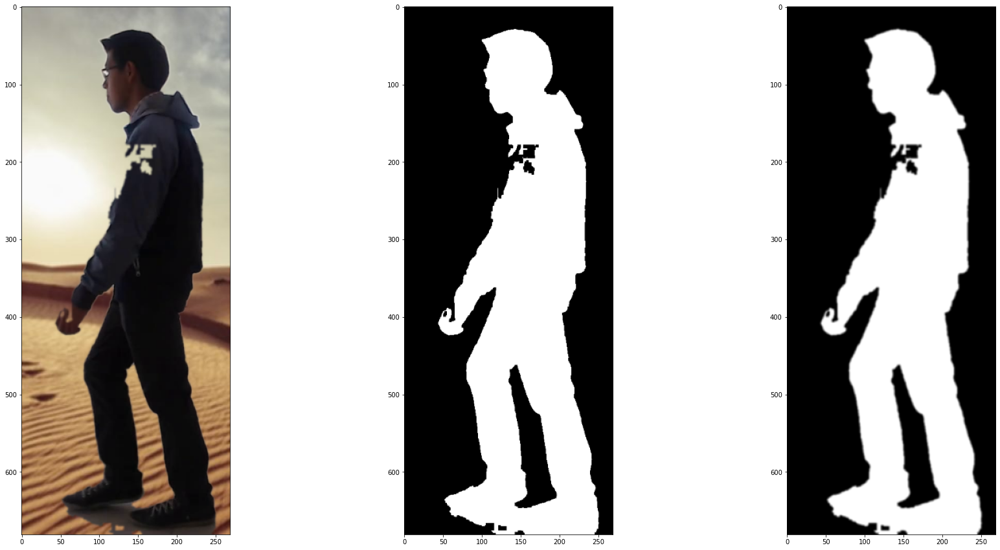

In [11]:
def preposessing(image, mask, background):
  if mask.mean() > 3:
    blured = cv2.GaussianBlur(mask,(5,5),0)
    roi_img, roi_fine, roi_blur, roi_bkgrd = roi_gen(image, mask, blured, background)
    blended = blending(roi_img, roi_blur, roi_bkgrd)
    return True, blended, roi_fine, roi_blur
  else:
    return False, None, None, None
    
background = random.choice(back)
ret, img, fine, blur = preposessing(rgb, msk, background)
if ret:
  plt.figure(figsize=(30, 15))
  plt.subplot(131); plt.imshow(img[:,:,::-1]);
  plt.subplot(132); plt.imshow(fine, 'gray');
  plt.subplot(133); plt.imshow(blur, 'gray');

In [ ]:
msk.mean()

7.106990017361111

UCB DATASET

In [6]:
images_dir = '/home/israel/Downloads//UCB/frames/'
views = ['090']
frs_dir = 'rgb/'
mks_dir = 'masks/'
verbose = False

nclips = {'nm':6, 'bg':4, 'cl':4}

SHOWING VIEW: 090
Showing subject: 001 view: 090


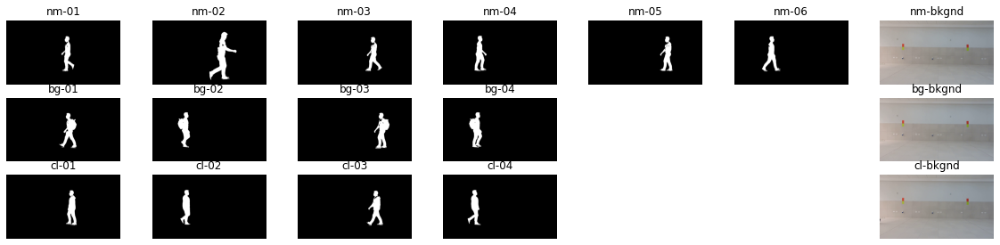

Showing subject: 002 view: 090


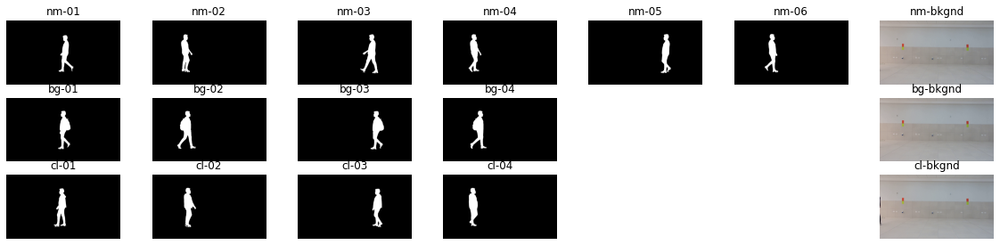

Showing subject: 003 view: 090


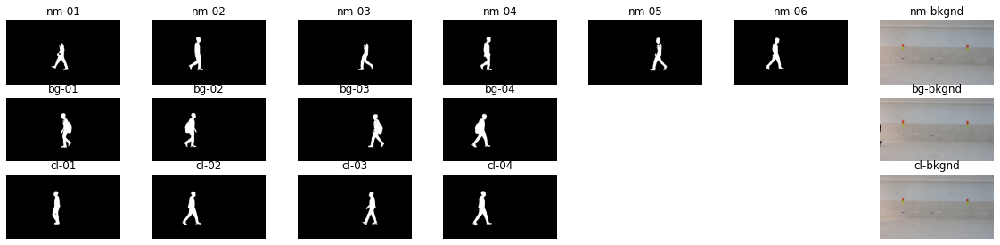

Showing subject: 004 view: 090


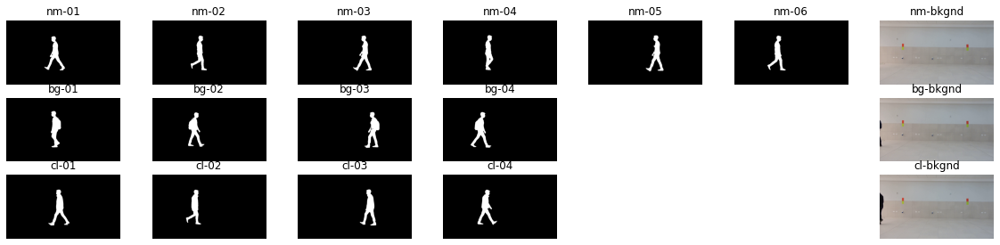

Showing subject: 005 view: 090


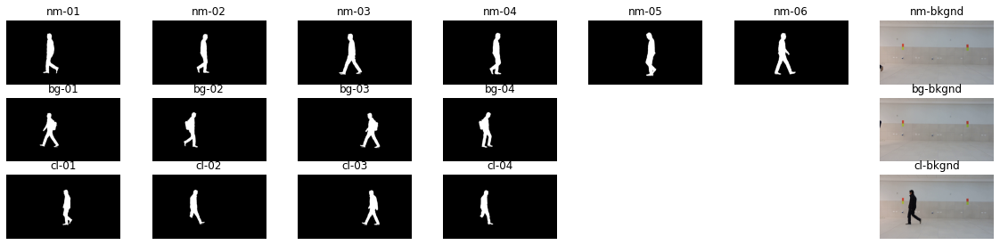

Showing subject: 006 view: 090


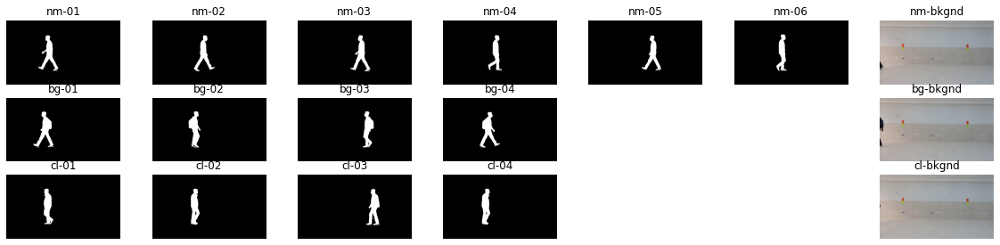

Showing subject: 007 view: 090


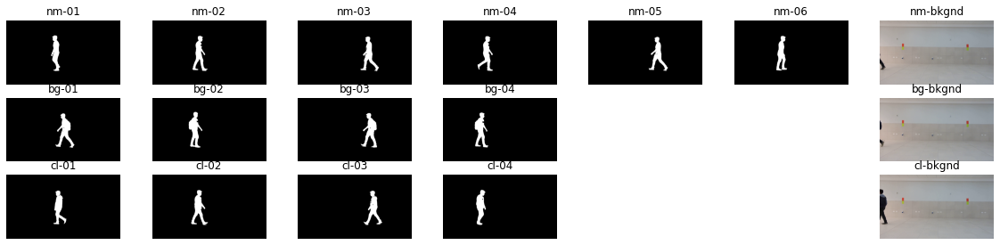

Showing subject: 008 view: 090


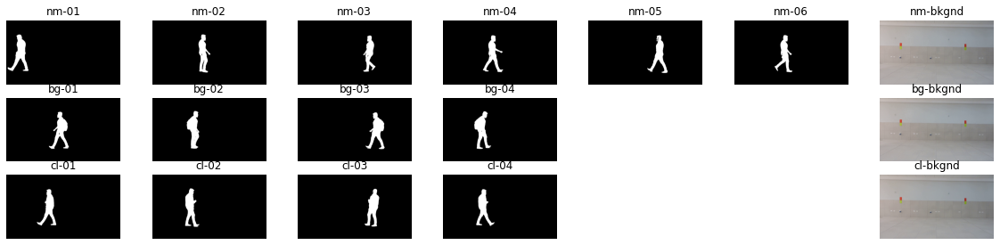

Showing subject: 009 view: 090


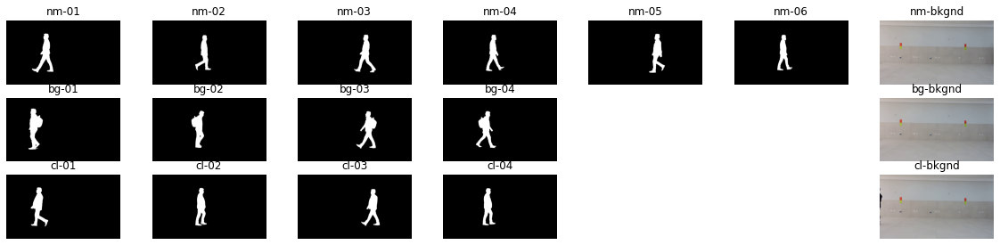

Showing subject: 010 view: 090


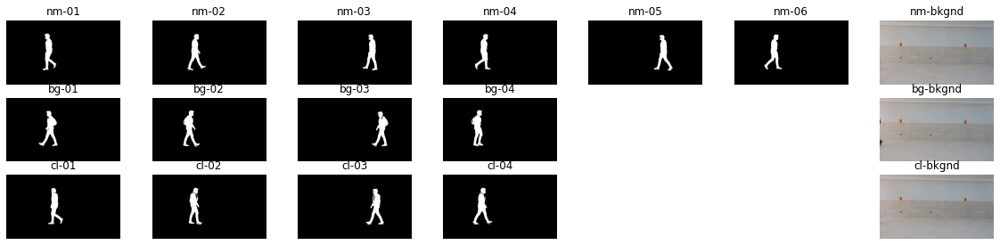

Showing subject: 011 view: 090


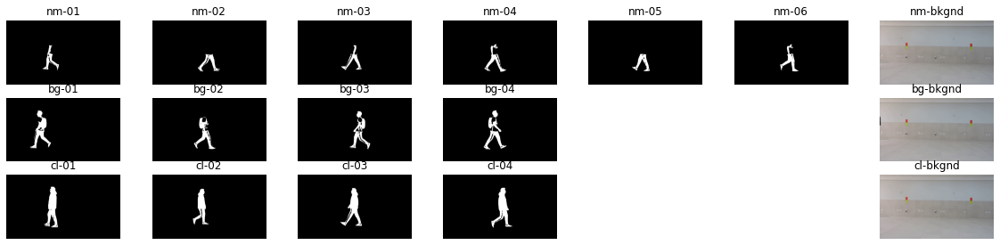

Showing subject: 012 view: 090


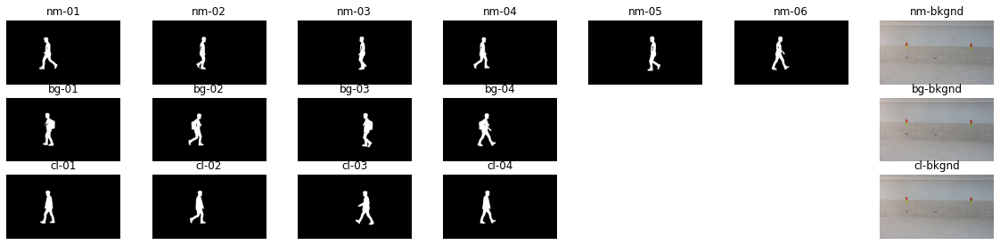

Showing subject: 013 view: 090


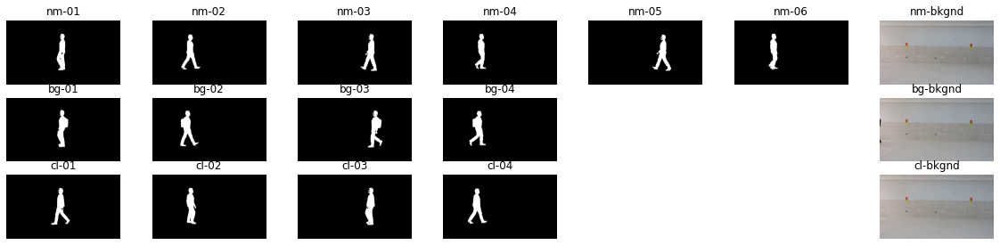

Showing subject: 014 view: 090


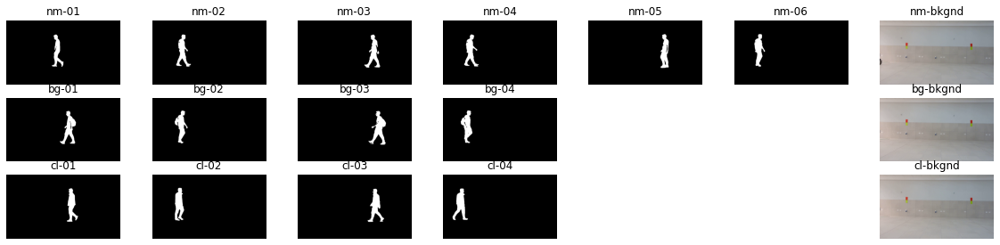

Showing subject: 015 view: 090


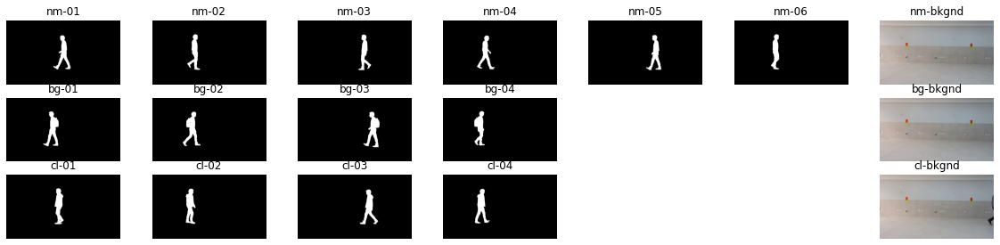

Showing subject: 016 view: 090


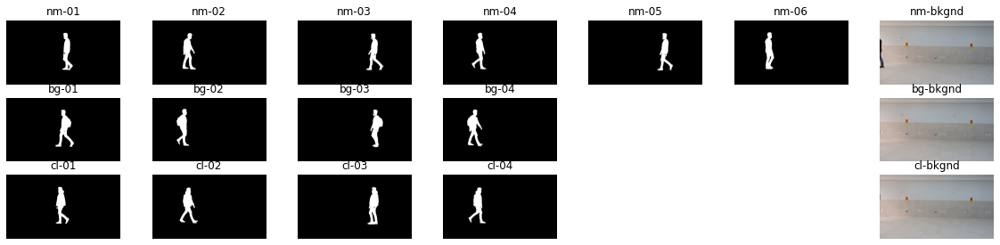

Showing subject: 017 view: 090


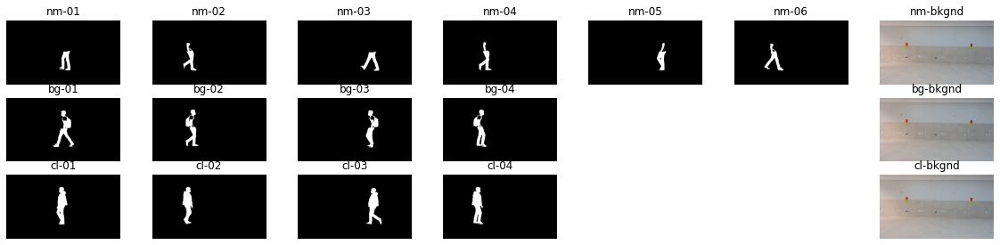

Showing subject: 018 view: 090


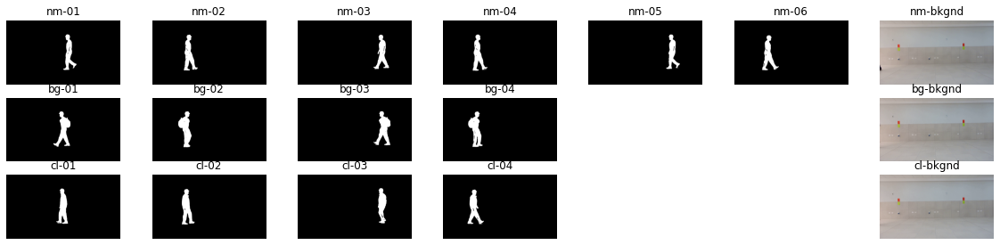

Showing subject: 019 view: 090


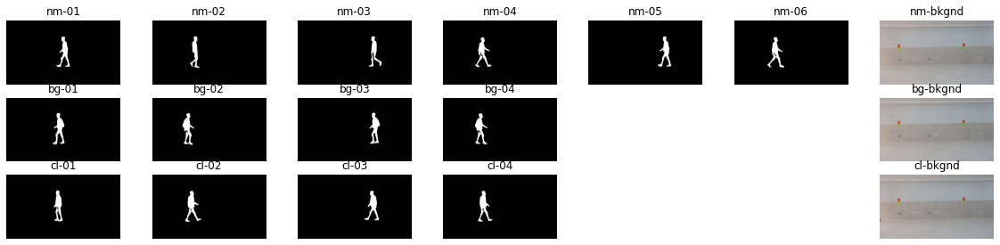

Showing subject: 020 view: 090


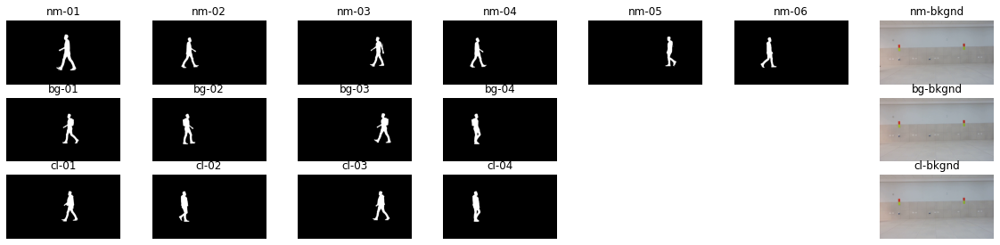

Showing subject: 021 view: 090


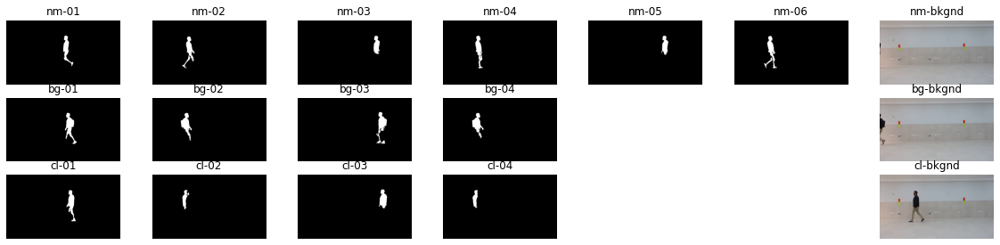

Showing subject: 022 view: 090
Error: cl-01


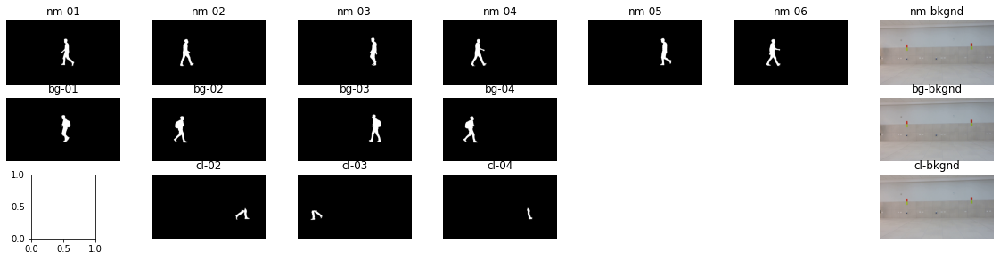

Showing subject: 023 view: 090
Error: cl-01
Error: cl-03


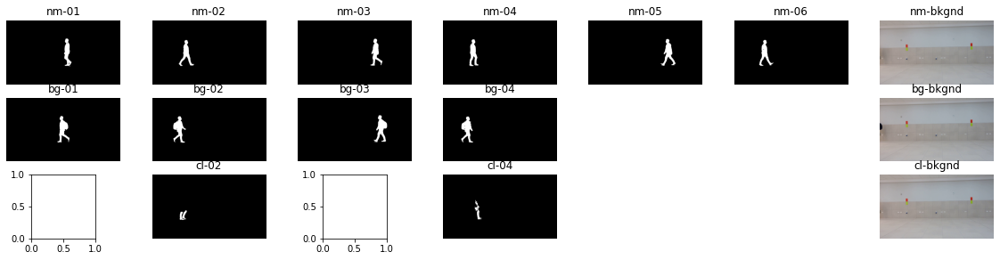

Showing subject: 024 view: 090


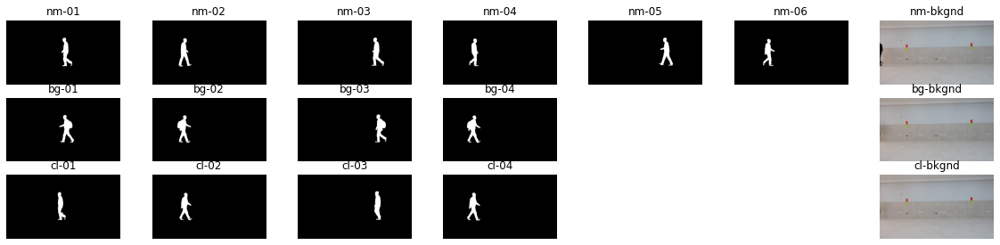

Showing subject: 025 view: 090


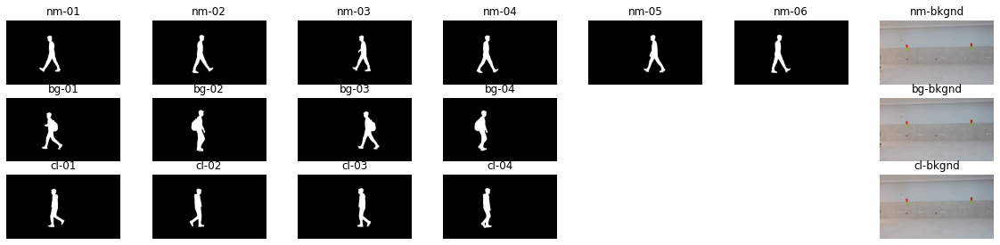

Showing subject: 026 view: 090


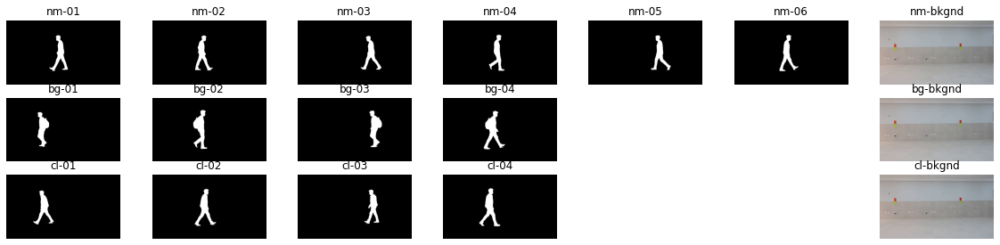

Showing subject: 027 view: 090


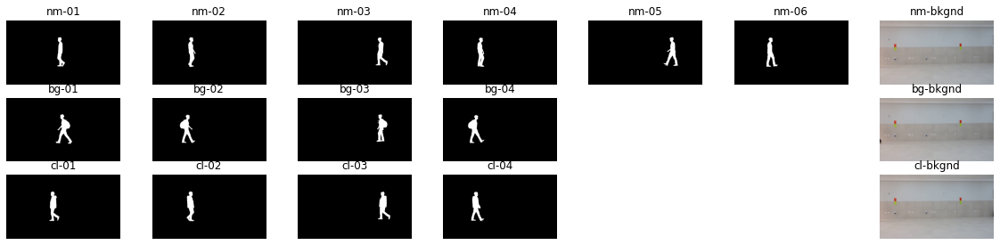

Showing subject: 028 view: 090


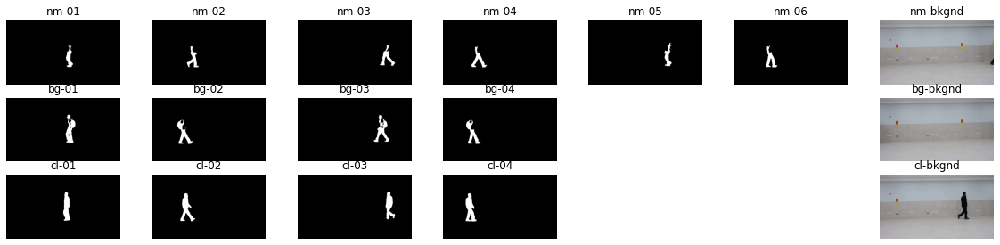

Showing subject: 029 view: 090


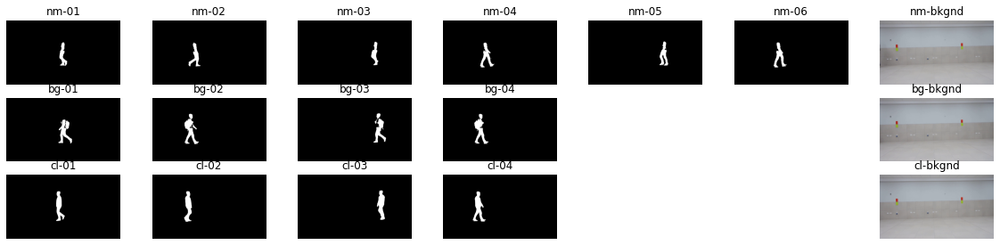

Showing subject: 030 view: 090


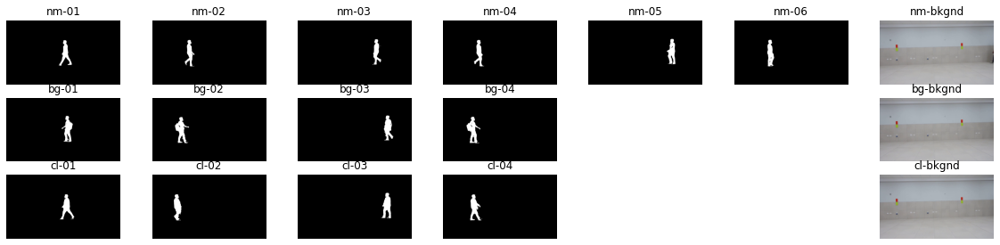

Showing subject: 031 view: 090


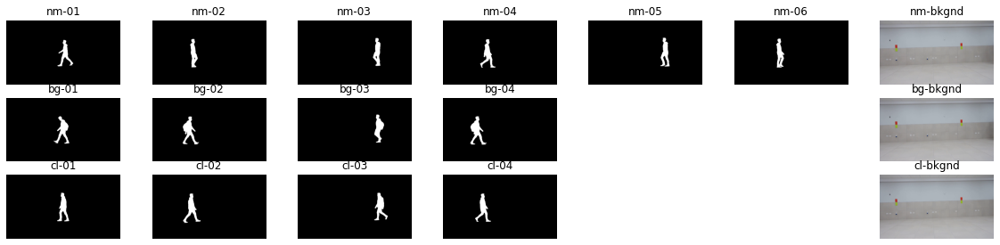

Showing subject: 032 view: 090


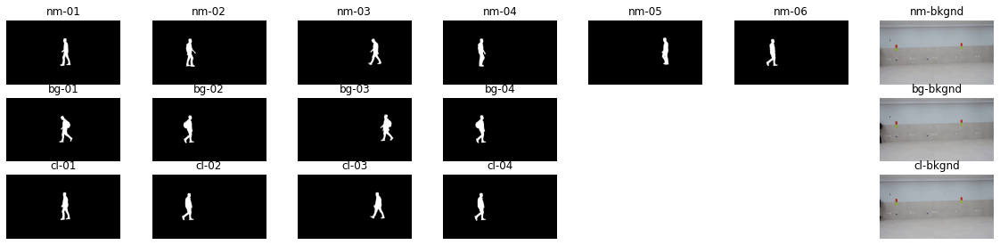

Showing subject: 033 view: 090


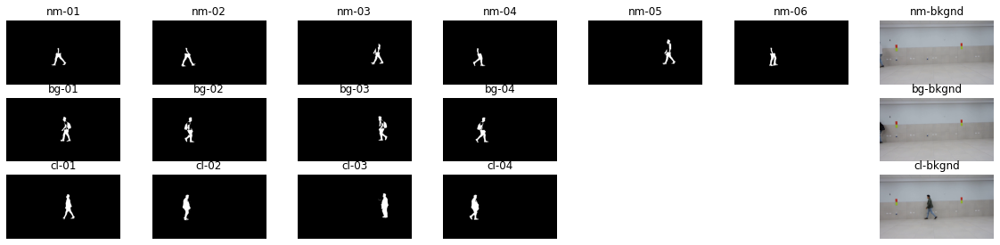

Showing subject: 034 view: 090


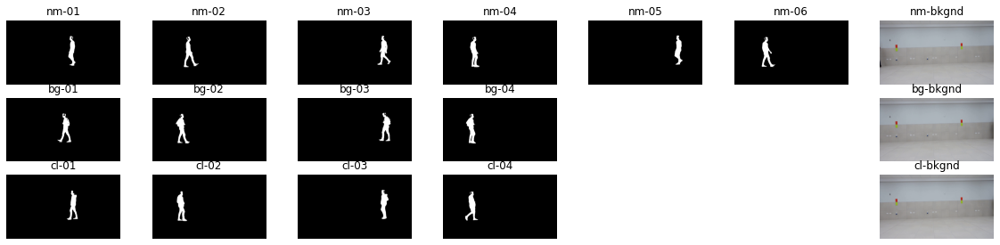

Showing subject: 035 view: 090


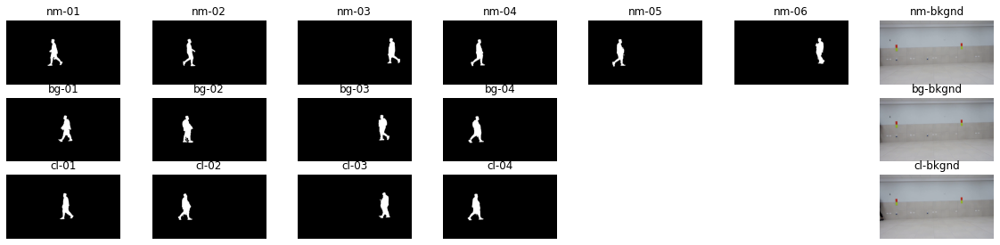

Showing subject: 036 view: 090


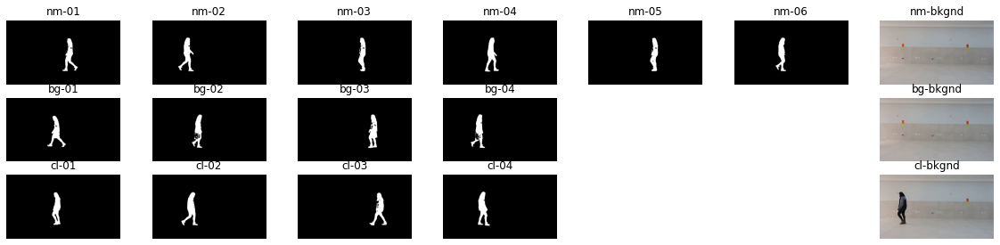

Showing subject: 037 view: 090


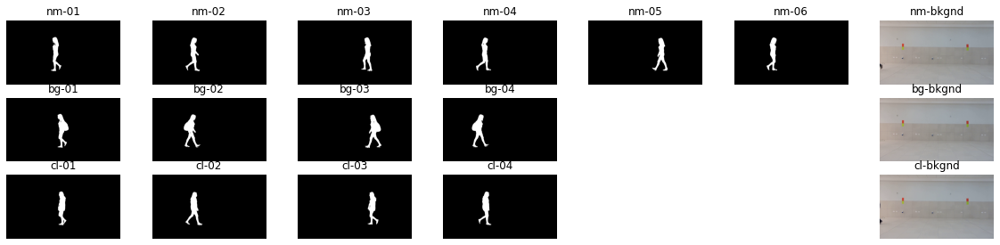

Showing subject: 038 view: 090


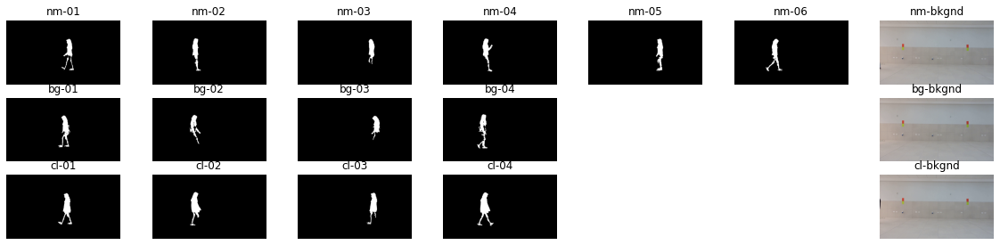

Showing subject: 039 view: 090


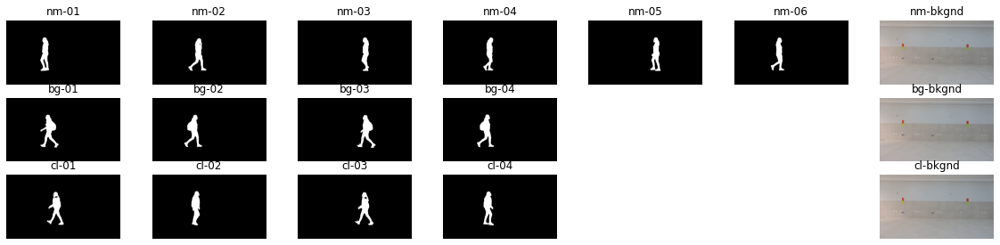

Showing subject: 040 view: 090


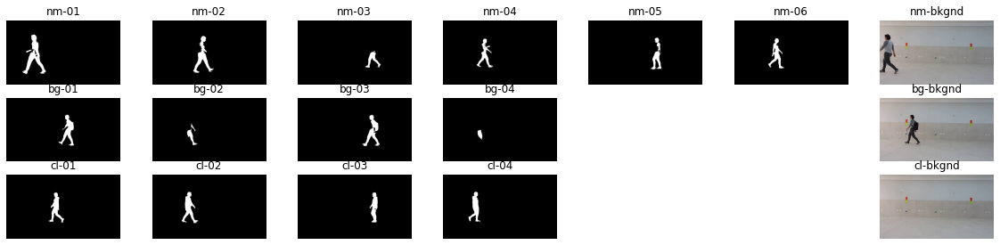

Showing subject: 041 view: 090


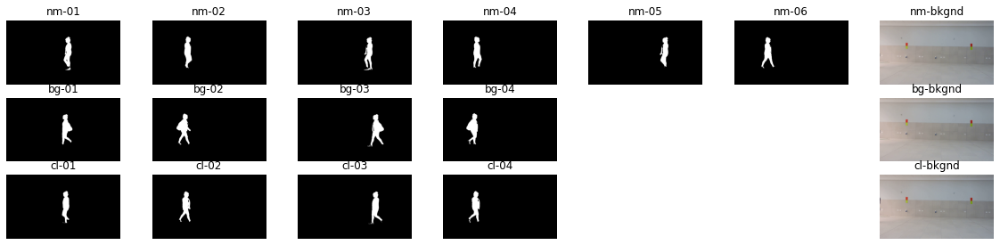

Showing subject: 042 view: 090


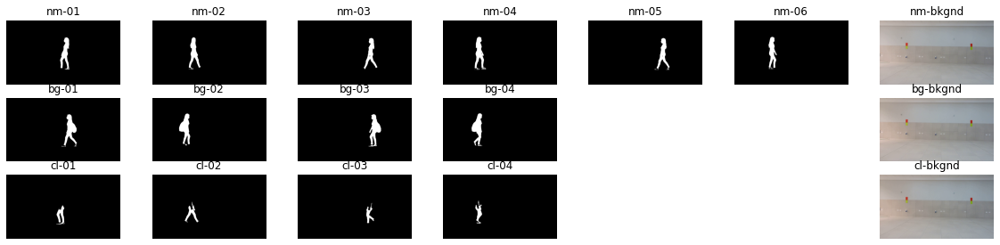

Showing subject: 043 view: 090


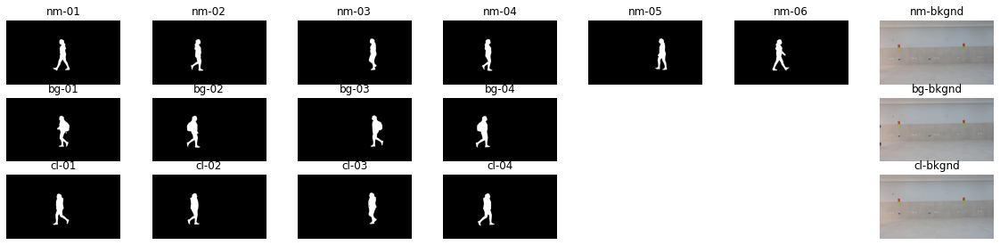

Showing subject: 044 view: 090


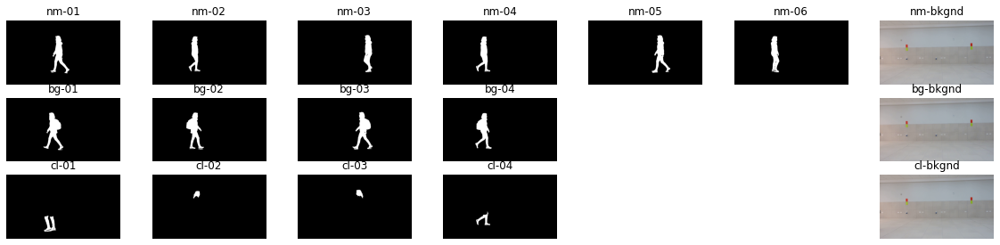

Showing subject: 045 view: 090


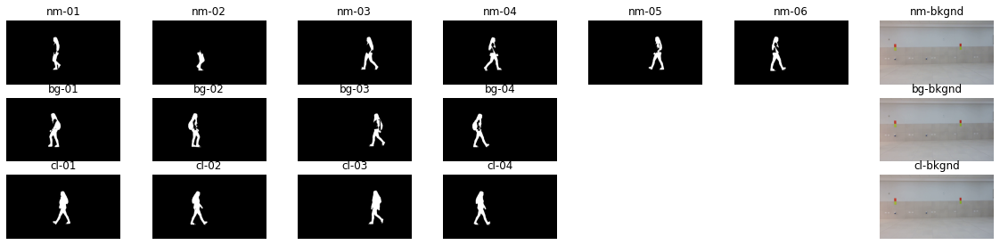

Showing subject: 046 view: 090


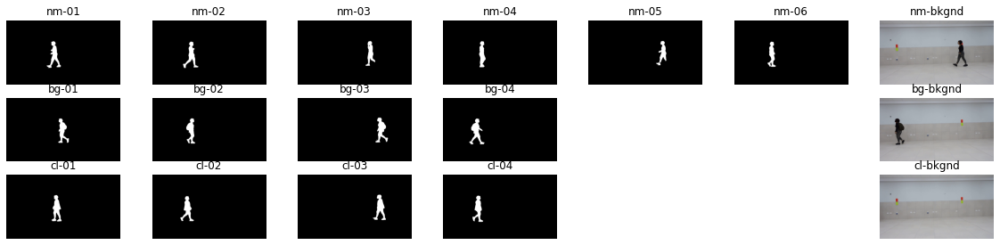

Showing subject: 047 view: 090


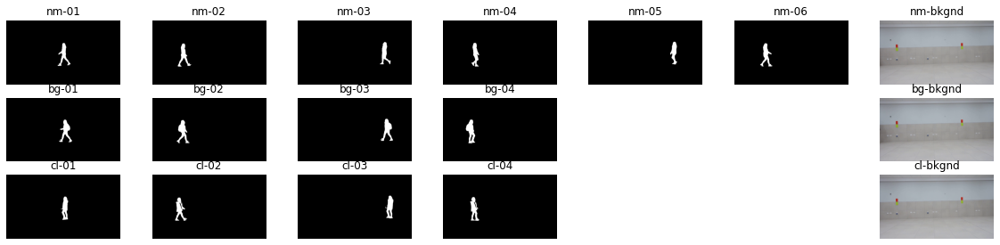

Showing subject: 048 view: 090


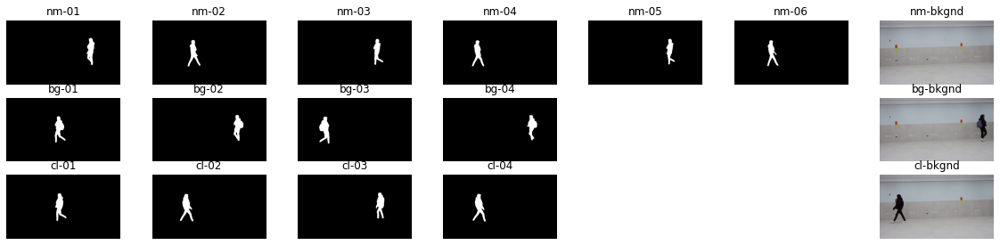

Showing subject: 049 view: 090


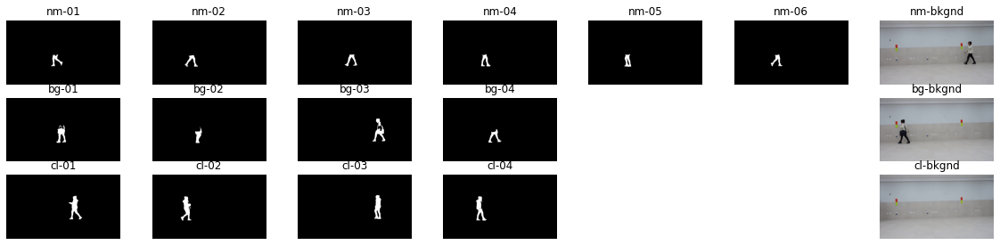

Showing subject: 050 view: 090


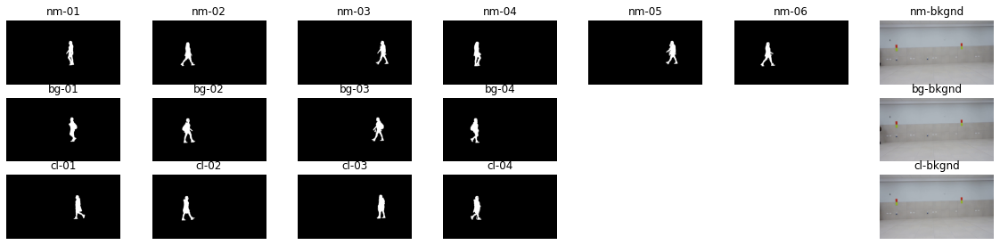

Showing subject: 051 view: 090


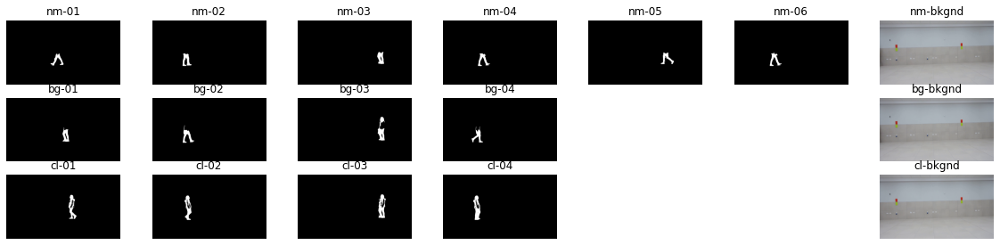

In [ ]:
for view in views:
    frames_dir = os.path.join(images_dir, view, frs_dir)
    masks_dir = os.path.join(images_dir, view, mks_dir)
    print(f'SHOWING VIEW: {view}')
    subjects = sorted(os.listdir(frames_dir))
    for subject in subjects:
    # for subject in ['023']:
        print(f'Showing subject: {subject} view: {view}')

        plt.figure(figsize=(20, 4.5))
#         plt.subplots_adjust(wspace=0.1, hspace=0.01)
        for j, walk in enumerate(['nm', 'bg', 'cl']):
            nplot = j*7 + 1
            rseqs_dir = os.path.join(frames_dir, subject, walk)
            mseqs_dir = os.path.join(masks_dir, subject, walk)
            
            seqs = sorted(os.listdir(rseqs_dir))
            bkgnd_path = os.path.join(frames_dir, subject, f'{walk}-background.png')
            bkgnd = cv2.imread(bkgnd_path)
            plt.subplot(3, 7, 7*(j+1)); plt.imshow(bkgnd[:,:,::-1]); plt.title(f'{walk}-bkgnd'); plt.axis('off')
            for i, seq in enumerate(seqs):
                rgb = cv2.imread(os.path.join(rseqs_dir, seq, f'{str(40).zfill(4)}.png'))
                msk = cv2.imread(os.path.join(mseqs_dir, seq, f'{str(40).zfill(4)}.png'))
                try:
                  plt.subplot(3, 7, nplot); plt.imshow(msk); plt.title(seq); plt.axis('off')
                except:
                  print(f'Error: {seq}')
                nplot+=1
        plt.show()

In [8]:
directory = '/home/israel/Downloads/UCB/frames/090/'
mask_dir = 'masks/'
img_dir = 'rgb/'
views = ['090']
subjects = sorted(os.listdir(os.path.join(directory, img_dir)))
skip = [3, 11, 17, 19, 21, 22, 23, 28, 29, 33, 38, 40, 42, 44, 45, 49, 51]

In [9]:
# Define the output Directories
img_dir = '/home/israel/Downloads/roiDB/DB_08-09-21/input/'
fine_dir = '/home/israel/Downloads/roiDB/DB_08-09-21/fine/'
blur_dir = '/home/israel/Downloads/roiDB/DB_08-09-21/blur/'
new = True

# create_dir(directory, force=True)
if new:
    create_dir(os.path.join(img_dir), force=True)
    create_dir(os.path.join(fine_dir), force=True)
    create_dir(os.path.join(blur_dir), force=True)

/home/israel/Downloads/roiDB/DB_08-09-21/input/ already exists. Creating a new one
/home/israel/Downloads/roiDB/DB_08-09-21/fine/ already exists. Creating a new one
/home/israel/Downloads/roiDB/DB_08-09-21/blur/ already exists. Creating a new one


In [31]:
sorted(os.listdir(frames_dir))[44:]

['046', '047', '048', '049', '050', '051', '052', '052a', '053', '053a']

In [12]:
count = 0
for view in views:
    frames_dir = os.path.join(images_dir, view, frs_dir)
    masks_dir = os.path.join(images_dir, view, mks_dir)
    print(f'Processing VIEW: {view}')
    subjects = sorted(os.listdir(frames_dir))
    for subject in subjects:
#     for subject in ['001']:
        if int(subject) not in skip:
            for j, walk in enumerate(['nm', 'bg', 'cl']):
                rseqs_dir = os.path.join(frames_dir, subject, walk)
                mseqs_dir = os.path.join(masks_dir, subject, walk)
                seqs = sorted(os.listdir(rseqs_dir))
                print(f'Processing subject: {subject} walk: {walk}->', end='')
                for i, seq in enumerate(seqs):
                    imgs = os.listdir(os.path.join(rseqs_dir, seq))
                    # nframes = len(imgs)//2
                    print('|', end='')
                    for k, name in enumerate(imgs[::2]):
                        rgb = cv2.imread(os.path.join(rseqs_dir, seq, name))
                        msk = cv2.imread(os.path.join(mseqs_dir, seq, name), 0)
                        rgb = cv2.resize(rgb, (1280, 720), cv2.INTER_AREA)
                        msk = cv2.resize(msk, (1280, 720), cv2.INTER_AREA)
                        background = random.choice(back)
                        ret, img, fine, blur = preposessing(rgb, msk, background)
                        if ret:
                            file_name = f'{subject}-{seq}-{view}-{str(k).zfill(6)}.png'
                            img_path = os.path.join(img_dir, file_name)
                            fine_path = os.path.join(fine_dir, file_name)
                            blur_path = os.path.join(blur_dir, file_name)
                            cv2.imwrite(img_path, img)
                            cv2.imwrite(fine_path, fine)
                            cv2.imwrite(blur_path, blur)
                            if k%10==0:
                                print('.',end='')
                print('|')

Processing VIEW: 090
Processing subject: 001 walk: nm->|......|.....|........|........|.........|........|
Processing subject: 001 walk: bg->|.......|........|.........|........|
Processing subject: 001 walk: cl->|.......|........|........|.......|
Processing subject: 002 walk: nm->|......|.........|.......|........|........|........|
Processing subject: 002 walk: bg->|......|........|........|......|
Processing subject: 002 walk: cl->|......|........|........|........|
Processing subject: 004 walk: nm->|.....|......|......|......|......|.......|
Processing subject: 004 walk: bg->|.....|.......|.......|.......|
Processing subject: 004 walk: cl->|.....|.......|......|......|
Processing subject: 005 walk: nm->|.....|......|.....|.....|.....|......|
Processing subject: 005 walk: bg->|.....|.......|.......|.......|
Processing subject: 005 walk: cl->|......|......|.......|.......|
Processing subject: 006 walk: nm->|.....|......|......|.....|......|......|
Processing subject: 006 walk: bg->|

In [ ]:
len(os.listdir(img_dir))

544

In [ ]:
rgb = cv2.imread(os.path.join(rseqs_dir, seq, name))
msk = cv2.imread(os.path.join(mseqs_dir, seq, name), 0)
rgb = cv2.resize(rgb, (1280, 720), cv2.INTER_AREA)
# msk = cv2.resize(msk, (1280, 720), cv2.INTER_AREA)
plt.figure(figsize=(20,5))
plt.subplot(1,2,1); plt.imshow(rgb[:,:,::-1]); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(msk); plt.axis('off')

## DATASET PREPARATION

In [4]:
import tensorflow as tf
# from tensorflow_examples.models.pix2pix import pix2pix

AUTOTUNE = tf.data.experimental.AUTOTUNE
import matplotlib.pyplot as plt
import numpy as np
import os

config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)

2021-08-08 15:20:21.286238: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-08-08 15:20:22.847876: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2021-08-08 15:20:22.850225: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-08-08 15:20:22.925531: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-08-08 15:20:22.926056: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:01:00.0 na

In [4]:
len(os.listdir('/content/drive/MyDrive/Dataset/CASIA/OAK_dataset/casia_bst_e30f_dataset/input_casia'))

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Dataset/CASIA/OAK_dataset/casia_bst_e30f_dataset/input_casia'

In [27]:
# Paths
inpath  = 'segmentation/input_new/'
outpath = 'segmentation/output_new/'

inpath = '/home/israel/Downloads/roiDB/DB_08-09-21/input/'
outpath = '/home/israel/Downloads/roiDB/DB_08-09-21/fine/'
# inpath  = 'casia_bst_e30f_dataset/input_casia/'
# outpath = 'casia_bst_e30f_dataset/out_fine_casia/'

# imgurls = !ls -1 "{inpath}"
imgurls = os.listdir(inpath)
np.random.seed(23)
np.random.shuffle(imgurls)

# imgurls = imgurls[:30000]
n = len(imgurls)
train_n = round(n*0.98)

# Lista random
randurls = np.copy(imgurls)

tr_urls = randurls[:train_n]
ts_urls = randurls[train_n:n]

print('Total images:',len(imgurls),' \nTraining:',len(tr_urls),' Testing:', len(ts_urls))

Total images: 32025  
Training: 31384  Testing: 641


In [28]:
width, height = 128, 128

In [29]:
def normalize(input_image, input_mask):
  input_image = tf.cast(input_image, tf.float32) / 255.0
  input_mask = tf.cast(input_mask, tf.float32) / 255.0
  # input_mask -= 1
  return input_image, input_mask

def resize(inimg, tgimg, height, width):
  inimg = tf.image.resize(inimg, [height, width])
  tgimg = tf.image.resize(tgimg, [height, width])
  return inimg, tgimg

In [30]:
@tf.function
def load_image_train(filename):
  inimg = tf.image.decode_png(tf.io.read_file(inpath+'/'+filename),channels=3)
  tgimg = tf.image.rgb_to_grayscale(tf.image.decode_png(tf.io.read_file(outpath+'/'+filename),channels=3))
  
  input_image, input_mask = resize(inimg,tgimg, width, height)


  # input_image = tf.image.resize(tf.image.decode_png(tf.io.read_file(inpath+'/'+filename), channels=3), (width, height))
  # input_mask = tf.image.resize(tf.image.decode_png(tf.io.read_file(outpath+'/'+filename), channels=3), (width, height))

  # input_mask = tf.image.resize(tf.image.rgb_to_grayscale(tf.image.decode_png(tf.io.read_file(outpath+'/'+filename),channels=3)), (width, height))
  # input_mask = tf.image.rgb_to_grayscale(tf.image.decode_png(tf.io.read_file(outpath+'/'+filename),channels=3))
  if tf.random.uniform(()) > 0.5:
    input_image = tf.image.flip_left_right(input_image)
    input_mask = tf.image.flip_left_right(input_mask)

  input_image, input_mask = normalize(input_image, input_mask)

  return input_image, input_mask

def load_image_test(filename):
  input_image = tf.image.resize(tf.image.decode_png(tf.io.read_file(inpath+'/'+filename)), (width, height))
  input_mask = tf.image.resize(tf.image.rgb_to_grayscale(tf.image.decode_png(tf.io.read_file(outpath+'/'+filename),channels=3)), (width, height))
  # input_mask = tf.image.resize(tf.image.decode_png(tf.io.read_file(outpath+'/'+filename)), (width, height))

  input_image, input_mask = normalize(input_image, input_mask)

  return input_image, input_mask

The dataset already contains the required splits of test and train and so let's continue to use the same split.

In [31]:
TRAIN_LENGTH = len(tr_urls)
BATCH_SIZE = 32
BUFFER_SIZE = 1000
# STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

In [32]:
# train_dataset = tf.data.Dataset.from_tensor_slices(tr_urls).map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
# train_dataset = tf.data.Dataset.from_tensor_slices(ts_urls).map(load_image_test)
train = tf.data.Dataset.from_tensor_slices(tr_urls).map(load_image_train, num_parallel_calls=2)
test = tf.data.Dataset.from_tensor_slices(ts_urls).map(load_image_test)

In [33]:
train.cardinality().numpy()

31384

In [34]:
def configure_for_performance(ds):
  ds = ds.cache()
  ds = ds.shuffle(buffer_size=1000)
  ds = ds.batch(batch_size)
  ds = ds.prefetch(buffer_size=AUTOTUNE)
  return ds

train_dataset = train.cache('tr_cache8').shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=4)
test_dataset  = train.cache().batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)


Let's take a look at an image example and it's correponding mask from the dataset.

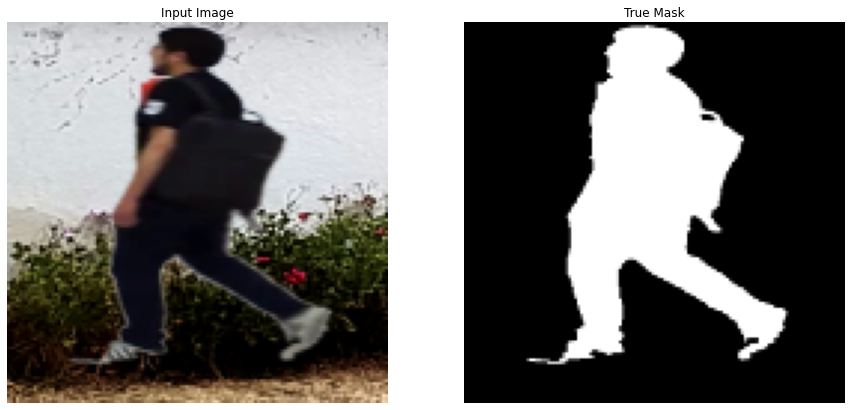

In [35]:
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]), 'gray')
    plt.axis('off')
  plt.show()

for image, mask in train.take(2):
  sample_image, sample_mask = image, mask
display([sample_image, sample_mask])

## Define the model
The model being used here is a modified U-Net. A U-Net consists of an encoder (downsampler) and decoder (upsampler). In-order to learn robust features, and reduce the number of trainable parameters, a pretrained model can be used as the encoder. Thus, the encoder for this task will be a pretrained MobileNetV2 model, whose intermediate outputs will be used, and the decoder will be the upsample block already implemented in TensorFlow Examples in the [Pix2pix tutorial](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py). 

The reason to output three channels is because there are three possible labels for each pixel. Think of this as multi-classification where each pixel is being classified into three classes.

As mentioned, the encoder will be a pretrained MobileNetV2 model which is prepared and ready to use in [tf.keras.applications](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/applications). The encoder consists of specific outputs from intermediate layers in the model. Note that the encoder will not be trained during the training process.

In [36]:
class InstanceNormalization(tf.keras.layers.Layer):
  def __init__(self, epsilon=1e-5):
    super(InstanceNormalization, self).__init__()
    self.epsilon = epsilon

  def build(self, input_shape):
    self.scale = self.add_weight(
        name='scale',
        shape=input_shape[-1:],
        initializer=tf.random_normal_initializer(1., 0.02),
        trainable=True)

    self.offset = self.add_weight(
        name='offset',
        shape=input_shape[-1:],
        initializer='zeros',
        trainable=True)

  def call(self, x):
    mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
    inv = tf.math.rsqrt(variance + self.epsilon)
    normalized = (x - mean) * inv
    return self.scale * normalized + self.offset

In [37]:
def downsample(filters, size, norm_type='batchnorm', apply_norm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters, 
                                    size, 
                                    strides=2, 
                                    padding='same', 
                                    kernel_initializer=initializer,
                                    use_bias=False))

  if apply_norm:
    if norm_type.lower() == 'batchnorm': 
      result.add(tf.keras.layers.BatchNormalization())
    elif norm_type.lower() == 'instancenorm': 
      result.add(InstanceNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [38]:
def upsample(filters, size, norm_type='batchnorm', apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, 
                                             size, 
                                             strides=2,
                                             padding='same',
                                             kernel_initializer=initializer,
                                             use_bias=False))

  if norm_type.lower() == 'batchnorm':
    result.add(tf.keras.layers.BatchNormalization())
  elif norm_type.lower() == 'instancenorm':
    result.add(InstanceNormalization())

  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.3))

  result.add(tf.keras.layers.ReLU())

  return result

In [39]:
def unet_generator(img_width, img_height, img_ch, output_channels, norm_type='batchnorm'):
  fsize = 3
  down_stack = [
      downsample(16, fsize, norm_type, apply_norm=False),                           # (bs, 32, 32, 64)
      downsample(32, fsize, norm_type),                                            # (bs, 16, 16, 128)
      downsample(64, fsize, norm_type),                                            # (bs, 8, 8, 256)
      downsample(128, fsize, norm_type),                                            # (bs, 4, 4, 512)
      # downsample(128, fsize, norm_type),                                          # (bs, 2, 2, 512)
      # downsample(256, 4, norm_type),                                          # (bs, 1, 1, 512)
  ]

  up_stack = [
      # upsample(256, 4, norm_type, apply_dropout=True),                        # (bs, 2, 2, 1024)
      # upsample(128, fsize, norm_type, apply_dropout=True),                        # (bs, 4, 4, 1024)
      upsample(64, fsize, norm_type, apply_dropout=True),                          # (bs, 8, 8, 512)
      upsample(32, fsize, norm_type),                                              # (bs, 16, 16, 256)
      upsample(16, fsize, norm_type),                                               # (bs, 32, 32, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(output_channels,
                                         4, 
                                         strides=2,
                                         padding='same', 
                                         kernel_initializer=initializer,
                                         activation='sigmoid')  # (bs, 256, 256, 3)

  concat = tf.keras.layers.Concatenate()
  inputs = tf.keras.layers.Input(shape=[img_width, img_height, img_ch])
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

## Train the model
Now, all that is left to do is to compile and train the model. The loss being used here is `losses.SparseCategoricalCrossentropy(from_logits=True)`. The reason to use this loss function is because the network is trying to assign each pixel a label, just like multi-class prediction. In the true segmentation mask, each pixel has either a {0,1,2}. The network here is outputting three channels. Essentially, each channel is trying to learn to predict a class, and `losses.SparseCategoricalCrossentropy(from_logits=True)` is the recommended loss for 
such a scenario. Using the output of the network, the label assigned to the pixel is the channel with the highest value. This is what the create_mask function is doing.

In [40]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
model = unet_generator(width, height, 3, 1, 'instancenorm')
model.compile(optimizer=generator_optimizer,
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])

In [41]:
tf.keras.utils.plot_model(model, show_shapes=True)

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


In [42]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
sequential_7 (Sequential)       (None, 64, 64, 16)   432         input_2[0][0]                    
__________________________________________________________________________________________________
sequential_8 (Sequential)       (None, 32, 32, 32)   4672        sequential_7[0][0]               
__________________________________________________________________________________________________
sequential_9 (Sequential)       (None, 16, 16, 64)   18560       sequential_8[0][0]               
____________________________________________________________________________________________

Let's try out the model to see what it predicts before training.

In [43]:
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [44]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], pred_mask[0]])
  else:
    display([sample_image, 
             sample_mask,
             model.predict(sample_image[tf.newaxis, ...])[0]
             ])

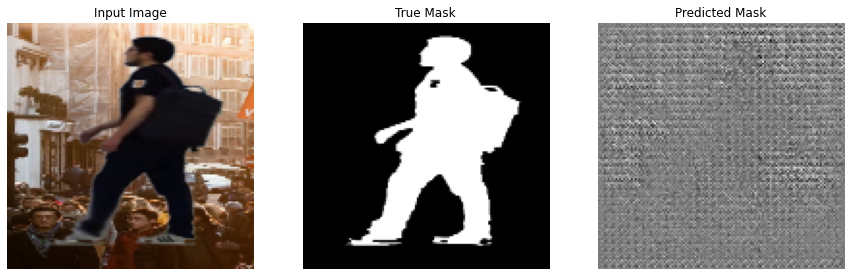

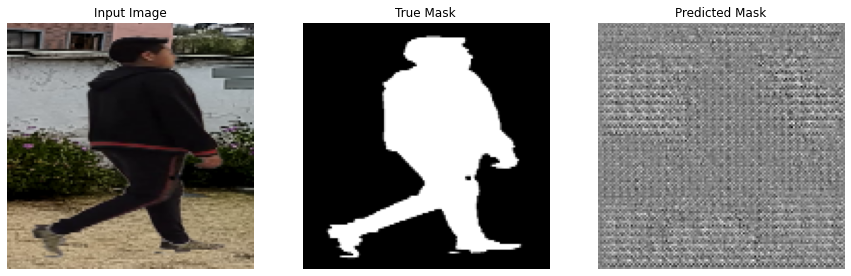

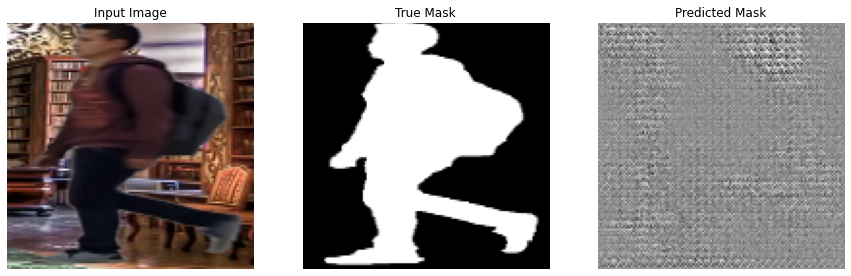

2021-08-08 15:26:12.563991: W tensorflow/core/kernels/data/cache_dataset_ops.cc:768] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


In [45]:
show_predictions(test_dataset, num=3)

Let's observe how the model improves while it is training. To accomplish this task, a callback function is defined below. 

In [46]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    # clear_output(wait=True)
    show_predictions()
    print('\nSample Prediction after epoch {}\n'.format(epoch+1))

In [47]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
model.compile(optimizer=generator_optimizer,
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])

In [ ]:
EPOCHS = 10

model_history = model.fit(train_dataset, 
                          epochs=EPOCHS,
                          validation_data=test_dataset,
                          callbacks=[DisplayCallback()])

Epoch 1/10
340/981 [=========>....................] - ETA: 3:15 - loss: 0.3809 - accuracy: 0.8676

In [32]:
generator_optimizer = tf.keras.optimizers.Adam(2e-5, beta_1=0.5)
model.compile(optimizer=generator_optimizer,
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])

Epoch 1/5
555/555 [==============================] - 64s 113ms/step - loss: 0.0620 - accuracy: 0.9530 - val_loss: 0.0612 - val_accuracy: 0.9533


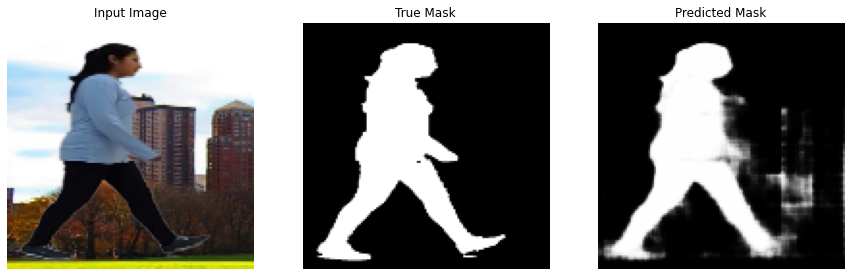


Sample Prediction after epoch 1

Epoch 2/5
555/555 [==============================] - 65s 114ms/step - loss: 0.0607 - accuracy: 0.9535 - val_loss: 0.0606 - val_accuracy: 0.9534


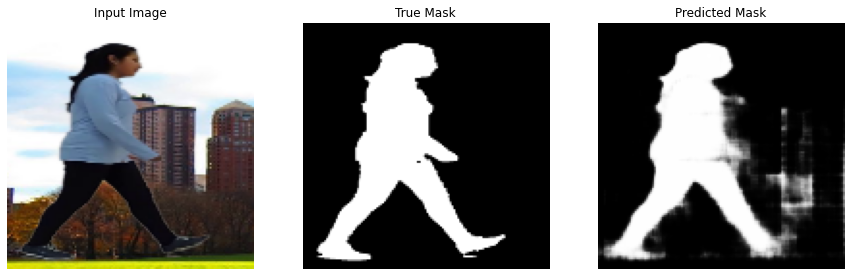


Sample Prediction after epoch 2

Epoch 3/5
555/555 [==============================] - 65s 115ms/step - loss: 0.0601 - accuracy: 0.9536 - val_loss: 0.0600 - val_accuracy: 0.9537


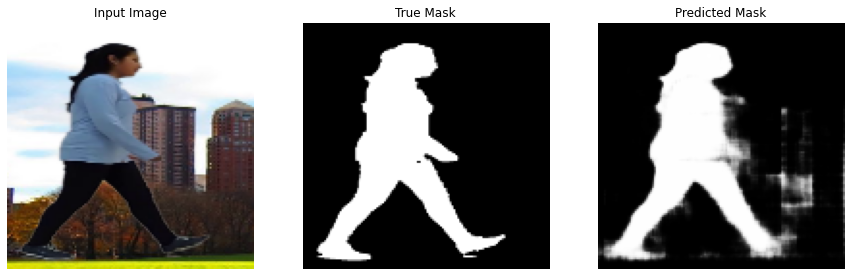


Sample Prediction after epoch 3

Epoch 4/5
555/555 [==============================] - 64s 114ms/step - loss: 0.0596 - accuracy: 0.9538 - val_loss: 0.0597 - val_accuracy: 0.9537


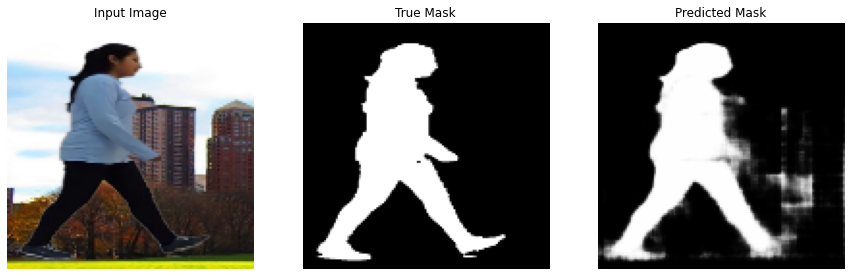


Sample Prediction after epoch 4

Epoch 5/5
555/555 [==============================] - 66s 117ms/step - loss: 0.0590 - accuracy: 0.9540 - val_loss: 0.0594 - val_accuracy: 0.9538


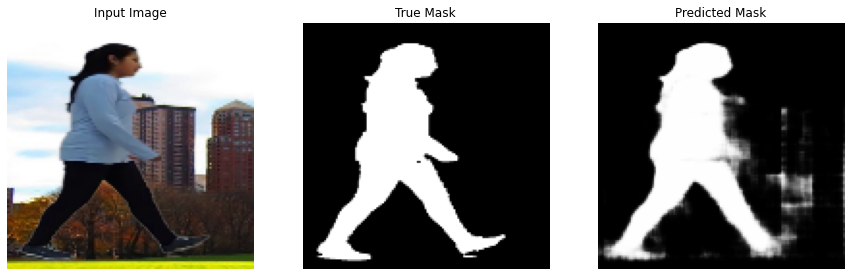


Sample Prediction after epoch 5



In [33]:
EPOCHS = 5
# VAL_SUBSPLITS = 2
# VALIDATION_STEPS = len(ts_urls)//BATCH_SIZE//VAL_SUBSPLITS

model_history = model.fit(train_dataset, 
                          epochs=EPOCHS,
                          # steps_per_epoch=STEPS_PER_EPOCH,
                          # validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset,
                          callbacks=[DisplayCallback()])

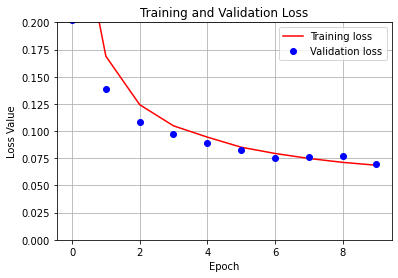

In [29]:
# 855ms/step - loss: 0.0380 - accuracy: 0.9655 - val_loss: 0.0476 - val_accuracy: 0.9621
# 128s 1s/step - loss: 0.0343 - accuracy: 0.9668 - val_loss: 0.0561 - val_accuracy: 0.9598
# 224x224 154s 1s/step - loss: 0.0531 - accuracy: 0.9616 - val_loss: 0.0604 - val_accuracy: 0.9589
# 224x224 135s 1s/step - loss: 0.0427 - accuracy: 0.9646 - val_loss: 0.0544 - val_accuracy: 0.9604
# loss: 0.2431 - accuracy: 0.9034 - val_loss: 0.2151 - val_accuracy: 0.9250
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 0.2])
plt.legend()
plt.grid()
plt.show()

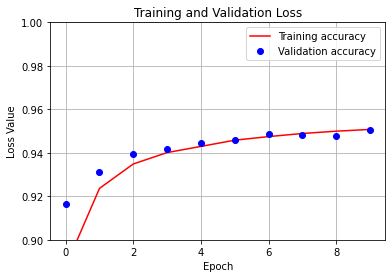

In [30]:
acc = model_history.history['accuracy']
val_acc = model_history.history['val_accuracy']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'bo', label='Validation accuracy')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0.9, 1])
plt.grid()
plt.legend()
plt.show()

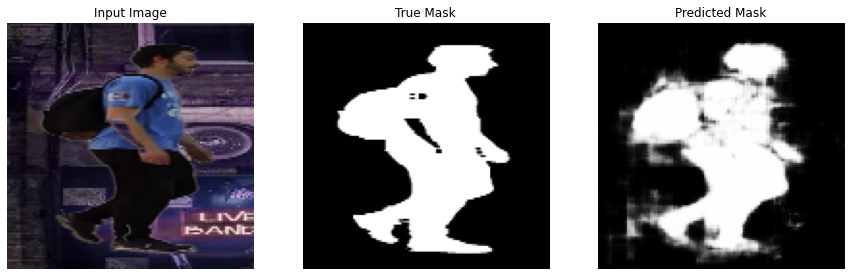

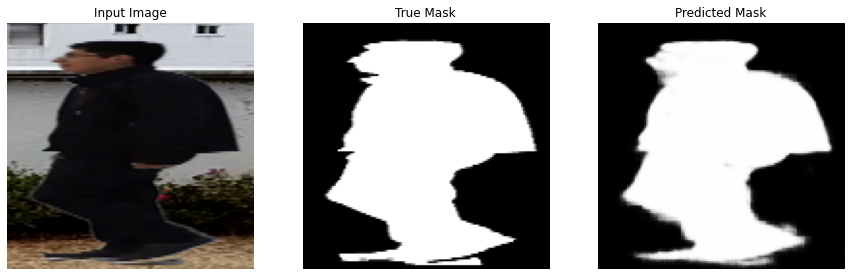

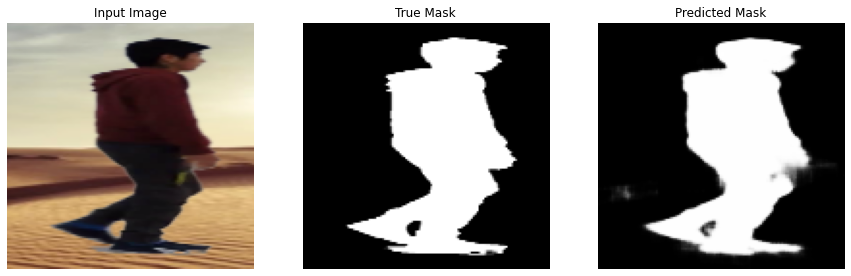

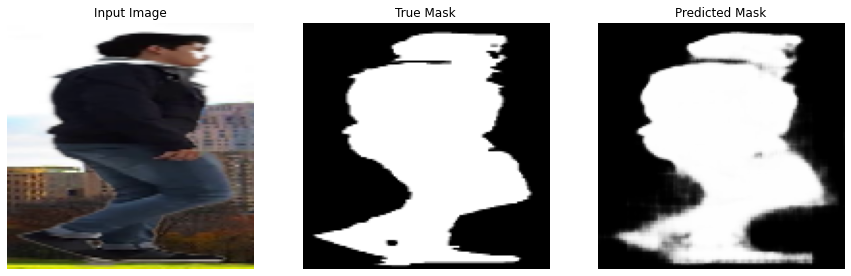

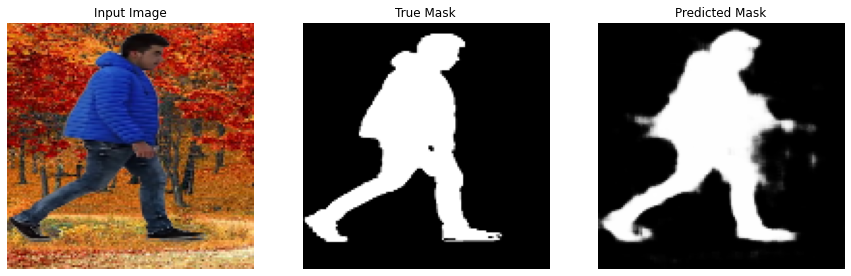

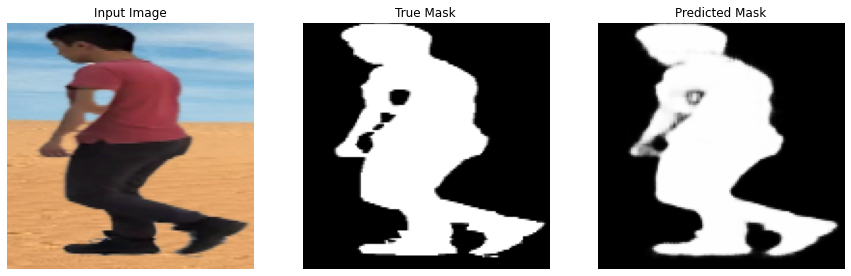

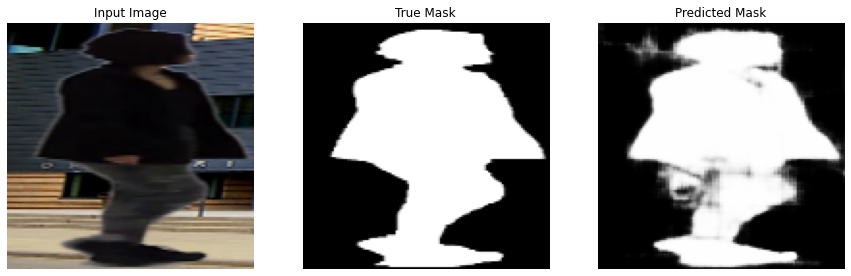

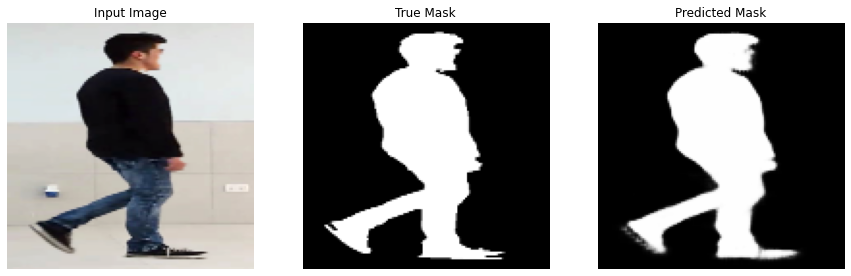

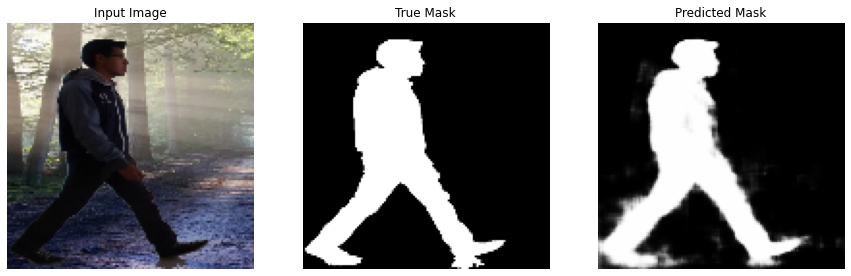

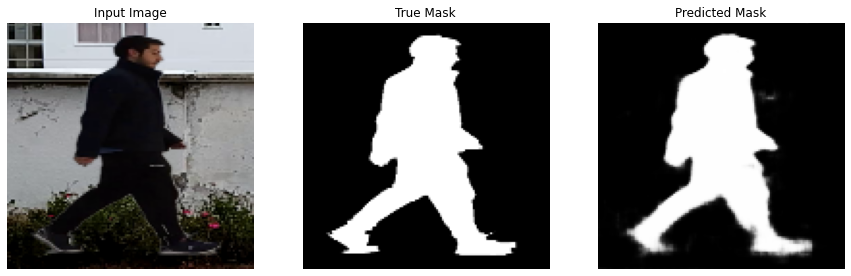

In [34]:
show_predictions(test_dataset, 10)

## Make predictions

Let's make some predictions. In the interest of saving time, the number of epochs was kept small, but you may set this higher to achieve more accurate results.

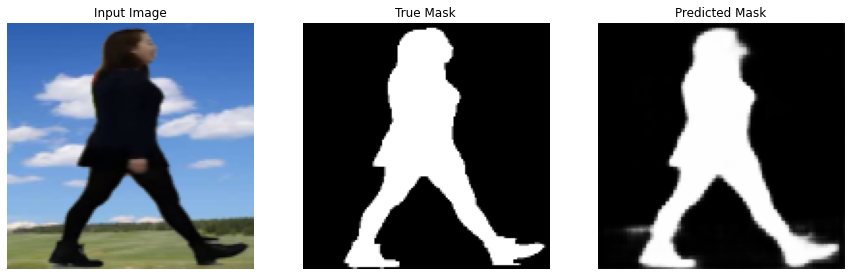

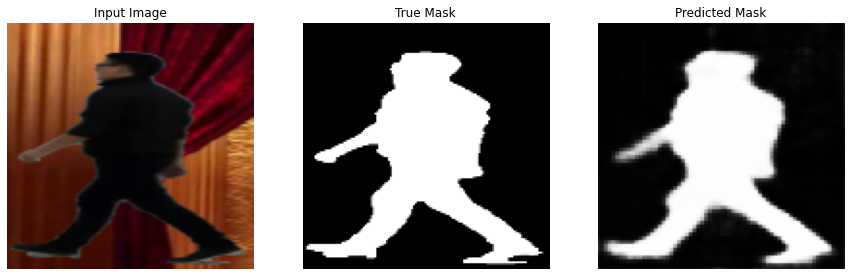

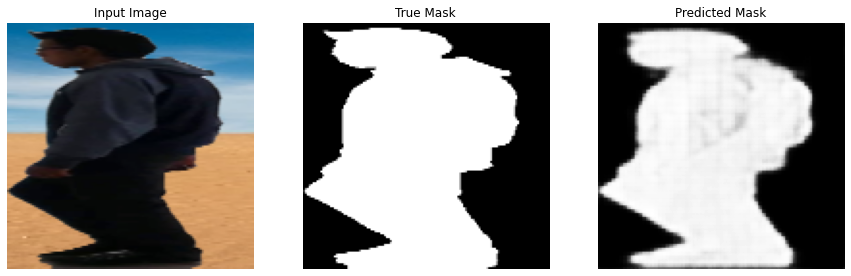

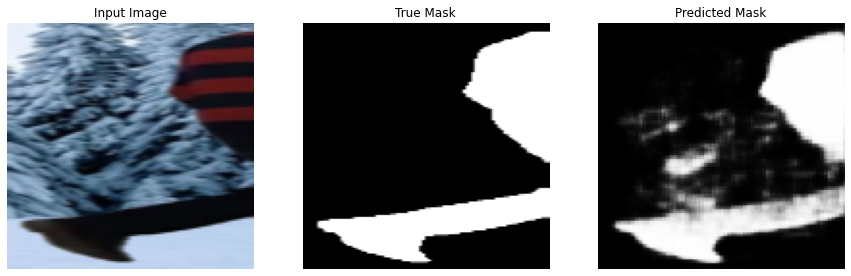

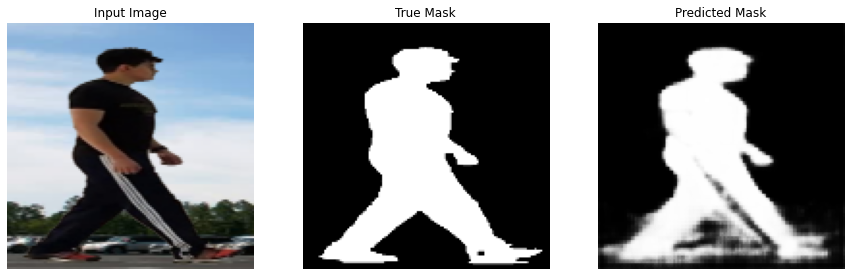

In [ ]:
show_predictions(train_dataset, 5)

In [ ]:
path = '/content/drive/Shared drives/Computer Vision group/ucb_walk/walking_clips/results/2/1280x720/trimmed.mp4'
# path = '/content/drive/Shareddrives/Computer Vision group/ucb_walk/005-cl-02-036.avi'
# path = '/content/drive/Shareddrives/Computer Vision group/ucb_walk/006-cl-01-036.avi'

In [ ]:
cap = cv2.VideoCapture(path)
for _ in range(61):
  ret, frame = cap.read()
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

In [ ]:
# import cv2 
import imutils 
   
# Initializing the HOG person 
# detector 
hog = cv2.HOGDescriptor() 
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector()) 
   
# Reading the Image 
# image = frame
   
# Resizing the Image 
# image = imutils.resize(image, 
#                        width=min(400, image.shape[1])) 
   
# Detecting all the regions in the  
# Image that has a pedestrians inside it 
(regions, _) = hog.detectMultiScale(frame,  
                                    winStride=(8, 8)) 
print(regions)
# x, y, w, h = regions
# Drawing the regions in the Image 
for (x, y, w, h) in regions: 
    cv2.rectangle(frame, (x, y),  
                  (x + w, y + h),  
                  (0, 0, 255), 2) 

[[469 152 236 472]]


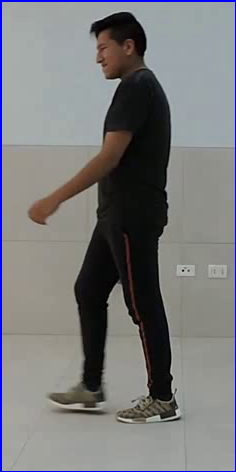

In [ ]:
crop = Image.fromarray(frame[y:y+h, x:x+w])
crop

In [ ]:
frame = Image.open('test2.jpg')
frame = np.array(frame)

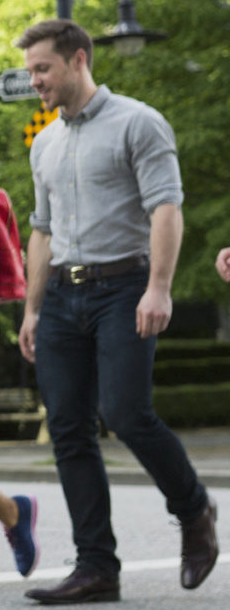

In [ ]:
crop = Image.fromarray(frame[330:940,1170:1400])
crop

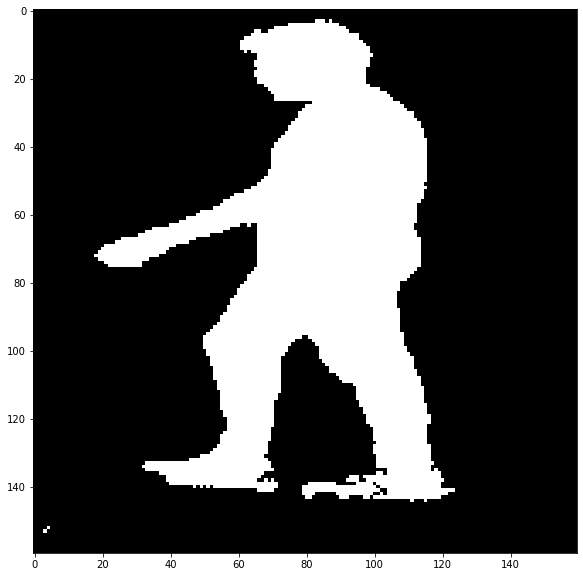

In [ ]:
tf_image = tf.image.resize(tf.convert_to_tensor(np.array(crop)),(width, height))/255
output = model.predict(tf.expand_dims(tf_image, 0))
out = np.where(output[0,:,:,0]>0.3, 1, 0)
plt.figure(figsize=(10,10))
plt.imshow(out, 'gray')
plt.show()

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(out, 'gray')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


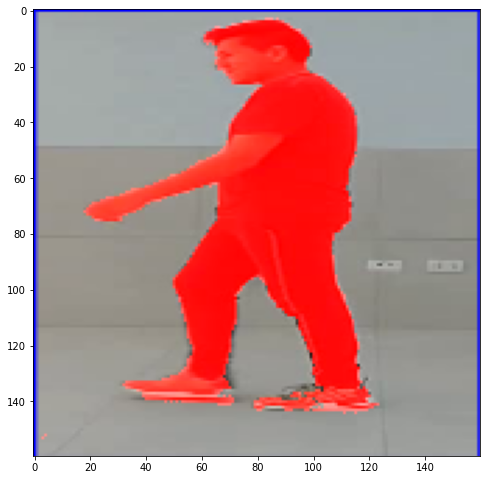

In [ ]:
color = random_colors(1)
# file_name = os.listdir(inpath)[500]
# img = Image.open(inpath+file_name)
# mask = Image.open(outpath+file_name)
masked = apply_mask(tf_image.numpy().copy(), out.astype('bool'),color[0],alpha=0.1)
plt.figure(figsize=(8,12))
plt.imshow(masked)
plt.show()

In [ ]:
(masked).max()

127.845

In [ ]:
!zip -r model.zip model/

  adding: model/ (stored 0%)
  adding: model/variables/ (stored 0%)
  adding: model/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: model/variables/variables.index (deflated 76%)
  adding: model/assets/ (stored 0%)
  adding: model/saved_model.pb (deflated 92%)


In [ ]:
new_model = tf.keras.models.load_model('my_model')

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
model (Functional)              [(None, 80, 80, 96), 1841984     input_2[0][0]                    
__________________________________________________________________________________________________
sequential (Sequential)         (None, 10, 10, 512)  1476608     model[0][4]                      
__________________________________________________________________________________________________
concatenate (Concatenate)       (None, 10, 10, 1088) 0           sequential[0][0]                 
                                                                 model[0][3]                

In [ ]:
model.save('my_model') 

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: my_model/assets


In [ ]:
model.save('160x160_fine_tuned.h5') 

In [ ]:
acc = model_history.history['accuracy'][-1]
loss = model_history.history['loss'][-1]
val_acc = model_history.history['val_accuracy'][-1]
val_loss = model_history.history['val_loss'][-1]
params = model.count_params()//1000000
models_name = f'{width}x{height}_acc:{acc:.4f}_loss:{loss:.4f}_val-acc:{val_acc:.4f}_val-loss:{val_loss:.4f}_{params}M_23-07-21'
models_name

'128x128_acc:0.9679_loss:0.0515_val-acc:0.9670_val-loss:0.0538_1M_23-07-21'

In [ ]:
model.save(models_name)
# model.save(models_name+'.h5') 

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


INFO:tensorflow:Assets written to: 160x160_acc:0.9652_loss:0.0490_val-acc:0.9637_val-loss:0.0531_5M_23-07-21/assets


In [ ]:
!pip install -q tensorflow-model-optimization


     |████████████████████████████████| 211 kB 35.0 MB/s eta 0:00:01


In [ ]:
import tensorflow_model_optimization as tfmot

prune_low_magnitude = tfmot.sparsity.keras.prune_low_magnitude

# Compute end step to finish pruning after 2 epochs.
# batch_size = 128
# epochs = 2
# validation_split = 0.1 # 10% of training set will be used for validation set. 

# num_images = train_images.shape[0] * (1 - validation_split)
# end_step = np.ceil(num_images / batch_size).astype(np.int32) * epochs

# Define model for pruning.
pruning_params = {
      'pruning_schedule': tfmot.sparsity.keras.PolynomialDecay(initial_sparsity=0.50,
                                                               final_sparsity=0.80,
                                                               begin_step=0,
                                                               end_step=8100)
}

model_for_pruning = prune_low_magnitude(model, **pruning_params)

# `prune_low_magnitude` requires a recompile.
model_for_pruning.compile(optimizer=generator_optimizer,
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])

model_for_pruning.summary()

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/base_layer.py:2191: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
model_2 (Functional)            [(None, 80, 80, 96), 1164977     input_4[0][0]                    
__________________________________________________________________________________________________
sequential_4 (Sequential)       (None, 20, 20, 512)  5310468     model_2[0][3]                    
__________________________________________________________________________________________________
prune_low_magnitude_concatenate (None, 20, 20, 704)  1           sequential_4[0][0]               
                                                                 model_2[0][2]              

In [ ]:
import tempfile

logdir = tempfile.mkdtemp()

callbacks = [
  tfmot.sparsity.keras.UpdatePruningStep(),
  tfmot.sparsity.keras.PruningSummaries(log_dir=logdir),
]

# model_for_pruning.fit(train_dataset, train_labels,
#                   batch_size=batch_size, epochs=epochs, validation_split=validation_split,
#                   callbacks=callbacks)

model_history = model_for_pruning.fit(train_dataset, 
                          epochs=5,
                          # steps_per_epoch=STEPS_PER_EPOCH,
                          # validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset,
                          callbacks=callbacks)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/5
127/127 [==============================] - 138s 762ms/step - loss: 0.1595 - accuracy: 0.9206 - val_loss: 0.1596 - val_accuracy: 0.9203
Epoch 2/5
127/127 [==============================] - 85s 623ms/step - loss: 0.1317 - accuracy: 0.9322 - val_loss: 0.1347 - val_accuracy: 0.9313
Epoch 3/5
127/127 [==============================] - 94s 696ms/step - loss: 0.1256 - accuracy: 0.9347 - val_loss: 0.1323 - val_accuracy: 0.9314
Epoch 4/5
127/127 [==============================] - 97s 670ms/step - loss: 0.1202 - accuracy: 0.9370 - val_loss: 0.1217 - val_accuracy: 0.9363
Epoch 5/5
127/127 [==============================] - 89s 637ms/step - loss: 0.1153 - accuracy: 0.9389 - val_loss: 0.1143 - val_accuracy: 0.9399


In [ ]:
def show_predictions_pruned(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model_for_pruning.predict(image)
      display([image[0], mask[0], pred_mask[0]])
  else:
    display([sample_image, 
             sample_mask,
             model.predict(sample_image[tf.newaxis, ...])[0]
             ])

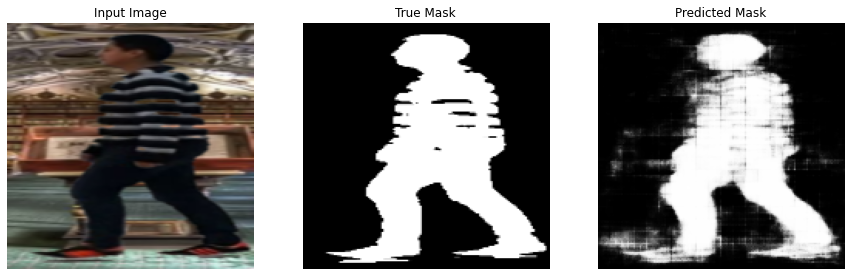

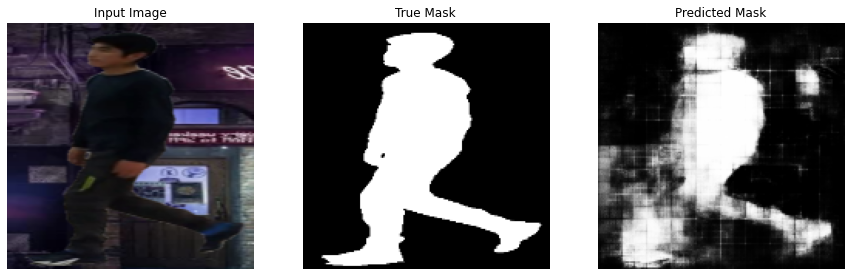

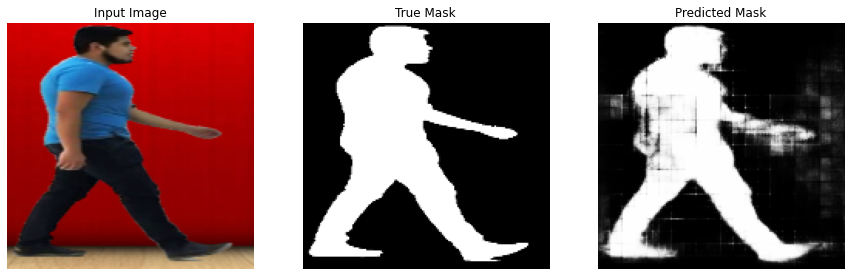

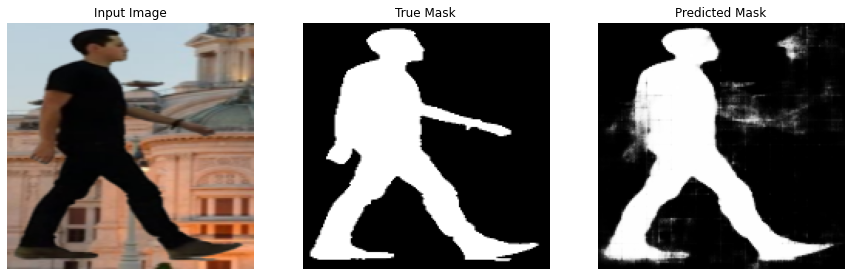

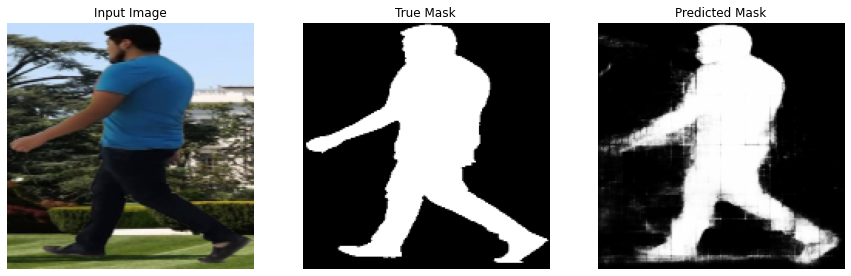

In [ ]:
show_predictions_pruned(test_dataset, 5)

In [ ]:
model_for_export = tfmot.sparsity.keras.strip_pruning(model_for_pruning)

# _, pruned_keras_file = tempfile.mkstemp('.h5')
# tf.keras.models.save_model(, pruned_keras_file, include_optimizer=True)
# print('Saved pruned Keras model to:', pruned_keras_file)

In [ ]:
model_history

NameError: ignored

In [35]:
acc = model_history.history['accuracy'][-1]
loss = model_history.history['loss'][-1]
val_acc = model_history.history['val_accuracy'][-1]
val_loss = model_history.history['val_loss'][-1]
params = round(model.count_params()/1000000,2)
models_name = f'{width}x{height}unet_acc:{acc:.4f}_loss:{loss:.4f}_val-acc:{val_acc:.4f}_val-loss:{val_loss:.4f}_{params}M_01-08-21-DB_UCB300_E:10x1E-4:5x1E-5'
models_name

'128x128unet_acc:0.9540_loss:0.0590_val-acc:0.9538_val-loss:0.0594_0.22M_01-08-21-DB_UCB300_E:10x1E-4:5x1E-5'

In [36]:
model.save(models_name)

2021-08-08 12:13:25.644921: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: 128x128unet_acc:0.9540_loss:0.0590_val-acc:0.9538_val-loss:0.0594_0.22M_01-08-21-DB_UCB300_E:10x1E-4:5x1E-5/assets


In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.python.framework.convert_to_constants import convert_variables_to_constants_v2
import numpy as np

2021-08-08 18:16:41.180236: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


In [3]:
model = tf.keras.models.load_model('../models/bestDB/128x128_acc_0.9471_loss_0.0605_val-acc_0.9476_val-loss_0.0586_0.22M_29-07-21-DB-best/')

2021-08-08 18:16:43.852865: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-08-08 18:16:43.903011: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-08-08 18:16:43.903366: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce MX350 computeCapability: 6.1
coreClock: 1.468GHz coreCount: 5 deviceMemorySize: 1.96GiB deviceMemoryBandwidth: 52.21GiB/s
2021-08-08 18:16:43.903393: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-08-08 18:16:43.906811: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2021-08-08 18:16:43.906874: I tensorflow/stream_executor/platform

In [5]:

#path of the directory where you want to save your model
frozen_out_path = ''
# name of the .pb file
frozen_graph_filename = '128x128_acc_0.9471_loss_0.0605_val-acc_0.9476_val-loss_0.0586_0.22M_29-07-21-DB-best'
# model = # Your model
# Convert Keras model to ConcreteFunction
full_model = tf.function(lambda x: model(x))
full_model = full_model.get_concrete_function(
    tf.TensorSpec(model.inputs[0].shape, model.inputs[0].dtype))
# Get frozen ConcreteFunction
frozen_func = convert_variables_to_constants_v2(full_model)
frozen_func.graph.as_graph_def()
layers = [op.name for op in frozen_func.graph.get_operations()]
print("-" * 60)
print("Frozen model layers: ")
for layer in layers:
    print(layer)
print("-" * 60)
print("Frozen model inputs: ")
print(frozen_func.inputs)
print("Frozen model outputs: ")
print(frozen_func.outputs)
# Save frozen graph to disk
tf.io.write_graph(graph_or_graph_def=frozen_func.graph,
                  logdir=frozen_out_path,
                  name=f"{frozen_graph_filename}.pb",
                  as_text=False)
# Save its text representation
tf.io.write_graph(graph_or_graph_def=frozen_func.graph,
                  logdir=frozen_out_path,
                  name=f"{frozen_graph_filename}.pbtxt",
                  as_text=True)

2021-08-08 18:19:17.604590: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-08-08 18:19:17.604846: I tensorflow/core/grappler/devices.cc:69] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0
2021-08-08 18:19:17.604958: I tensorflow/core/grappler/clusters/single_machine.cc:357] Starting new session
2021-08-08 18:19:17.605404: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-08-08 18:19:17.605648: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce MX350 computeCapability: 6.1
coreClock: 1.468GHz coreCount: 5 deviceMemorySize: 1.96GiB deviceMemoryBandwidth: 52.21GiB/s
2021-08-08 18:19:17.605782

------------------------------------------------------------
Frozen model layers: 
x
model_7/sequential_53/instance_normalization_39/5081
model_7/sequential_52/instance_normalization_38/5057
model_7/sequential_51/instance_normalization_37/5032
model_7/sequential_50/instance_normalization_36/5010
model_7/sequential_49/instance_normalization_35/5001
model_7/sequential_48/instance_normalization_34/4992
model_7/sequential_47/conv2d_27/Conv2D/ReadVariableOp/resource
model_7/sequential_47/conv2d_27/Conv2D/ReadVariableOp
model_7/sequential_47/conv2d_27/Conv2D
model_7/sequential_47/leaky_re_lu_27/LeakyRelu
model_7/sequential_48/conv2d_28/Conv2D/ReadVariableOp/resource
model_7/sequential_48/conv2d_28/Conv2D/ReadVariableOp
model_7/sequential_48/conv2d_28/Conv2D
Func/model_7/sequential_48/instance_normalization_34/StatefulPartitionedCall/input_control_node/_0
Func/model_7/sequential_48/instance_normalization_34/StatefulPartitionedCall/input/_2
Func/model_7/sequential_48/instance_normalization_34/

'128x128_acc_0.9471_loss_0.0605_val-acc_0.9476_val-loss_0.0586_0.22M_29-07-21-DB-best.pbtxt'

In [ ]:
graph_def = frozen_keras_graph(model)
    
# frozen_func.graph.as_graph_def()
tf.io.write_graph(graph_def, '.', 'frozen_graph.pb')